In [105]:
import os
os.environ["OMP_NUM_THREADS"] = "1"  # Limite le nombre de threads pour éviter le memory leak

In [ ]:
# Importation des librairies
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import datetime as dt

In [5]:
# Mise en place des options
pd.set_option('display.max_row',45)
pd.set_option('display.max_column',37)
sns.set(style='whitegrid')

In [7]:
# Importation des données
df_customers = pd.read_csv('olist_customers_dataset.csv')
#df_geoloc = pd.read_csv('olist_geolocation_dataset.csv') pas besoin de l'importer car on a deja ces colonnes dans customers et sellers
df_order_items = pd.read_csv('olist_order_items_dataset.csv')
df_order_pymts = pd.read_csv('olist_order_payments_dataset.csv')
df_order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')
df_orders = pd.read_csv('olist_orders_dataset.csv')
df_products = pd.read_csv('olist_products_dataset.csv')
df_sellers = pd.read_csv('olist_sellers_dataset.csv')
df_translation = pd.read_csv('product_category_name_translation.csv')

In [9]:
# Fusion des données dans un même dataset *df_olist*
df_olist = pd.merge(df_customers, df_orders, on ='customer_id')
df_olist = pd.merge(df_olist, df_order_reviews, on='order_id')
df_olist = pd.merge(df_olist, df_order_pymts, on='order_id')
df_olist = pd.merge(df_olist, df_order_items, on='order_id')
df_olist = pd.merge(df_olist, df_products, on='product_id')
df_olist = pd.merge(df_olist, df_sellers, on='seller_id')
#df_olist = pd.merge(df_olist, df_geoloc, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix')
df_olist = pd.merge(df_olist, df_translation, on='product_category_name')

# 1. Exploratory Data Analysis

## Objectif :
- Comprendre du mieux possible nos données (un petit pas en avant vaut mieux qu'un grand pas en arrière)
- Développer une première stratégie de modélisation

## Checklist de base
### Analyse de Forme :
- **Lignes et colonnes** : suppresion de product_cat_name en faveur de product_cat_name_eng -> (115609 lignes, 39 colonnes) voire (113193, 37) après supprission et enfin (113186, 37) que sur le commandes déjà livrées.
- **Types de variables** : dtypes: float64(10), int64(6), object(23)
- **Analyse des valeurs manquantes** : review_comment_title --> 88.062348% de NaN et review_comment_message --> 57.697065% de NaN, les autres ont des NaN négligables (inferieures à 2% de NaN) --> suppression envigageable.

### Analyse de Fond : 
- **Signification des variables** :
    - **Variables quantitatives** : review_score qui peux globalement representer voir remplacer (review_comment_title, review_comment_message) dans un clusturing. payment_value qui est la valeur du Montant total du paiement. order_purchase_timestamp : La date et l'heure de l'achat de la commande.
    - **Variables qualitatives** :
- **Analyse des dublons** : # Suppresion des doublons qui pourrons exister --> Chaque commande a un numéro de client unique.
- **Etude de quelques Variables**:


#### Variables a supprimer :
- product_category_name, review_comment_title, review_comment_message

In [12]:
df_olist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115609 entries, 0 to 115608
Data columns (total 40 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    115609 non-null  object 
 1   customer_unique_id             115609 non-null  object 
 2   customer_zip_code_prefix       115609 non-null  int64  
 3   customer_city                  115609 non-null  object 
 4   customer_state                 115609 non-null  object 
 5   order_id                       115609 non-null  object 
 6   order_status                   115609 non-null  object 
 7   order_purchase_timestamp       115609 non-null  object 
 8   order_approved_at              115595 non-null  object 
 9   order_delivered_carrier_date   114414 non-null  object 
 10  order_delivered_customer_date  113209 non-null  object 
 11  order_estimated_delivery_date  115609 non-null  object 
 12  review_id                     

In [14]:
df_olist.isna().mean()*100

customer_id                       0.000000
customer_unique_id                0.000000
customer_zip_code_prefix          0.000000
customer_city                     0.000000
customer_state                    0.000000
order_id                          0.000000
order_status                      0.000000
order_purchase_timestamp          0.000000
order_approved_at                 0.012110
order_delivered_carrier_date      1.033657
order_delivered_customer_date     2.075963
order_estimated_delivery_date     0.000000
review_id                         0.000000
review_score                      0.000000
review_comment_title             88.062348
review_comment_message           57.697065
review_creation_date              0.000000
review_answer_timestamp           0.000000
payment_sequential                0.000000
payment_type                      0.000000
payment_installments              0.000000
payment_value                     0.000000
order_item_id                     0.000000
product_id 

<Axes: >

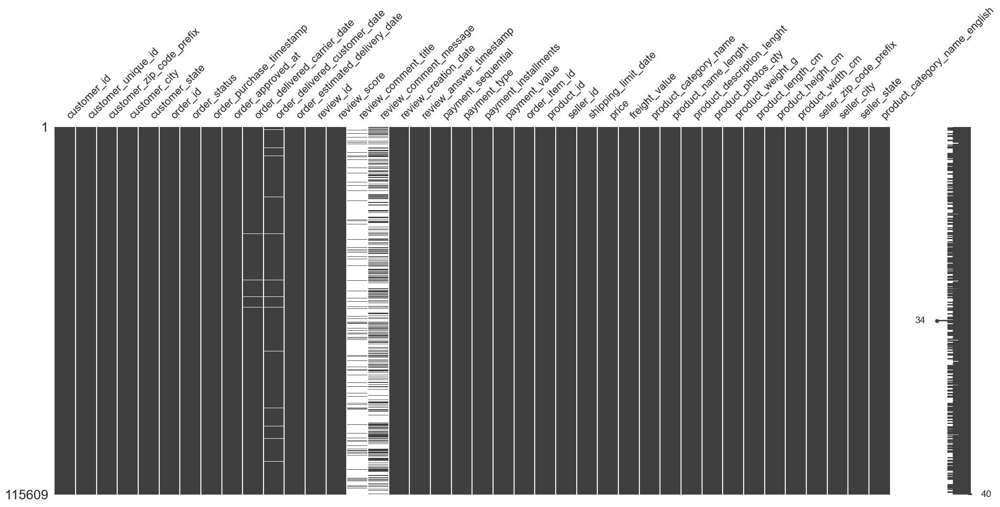

In [16]:
msno.matrix(df_olist)

In [18]:
list_columsn_to_delete = ['product_category_name','review_comment_title', 'review_comment_message' ]
for col in list_columsn_to_delete:
    if col in df_olist.columns:
        df_olist.drop(columns=col, inplace=True)
df_olist.dropna(inplace=True)
print(df_olist.isna().sum())
print(f"{df_olist.shape}")

customer_id                      0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_id                         0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
review_id                        0
review_score                     0
review_creation_date             0
review_answer_timestamp          0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
product_name_lenght              0
product_description_lenght       0
product_photos_qty  

In [20]:
# Conversion des colonnes (order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date, shipping_limit_date) datetime
columns_to_convert = ['order_purchase_timestamp', 'order_delivered_carrier_date', 'order_delivered_customer_date',
                              'order_estimated_delivery_date', 'shipping_limit_date']
for col in columns_to_convert:
    df_olist[col + '_dt'] = pd.to_datetime(df_olist[col])
    if col in df_olist.columns:
        df_olist.drop(columns=col, inplace=True) # Conversion en datetime + suppression de l'original
df_olist.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_approved_at,review_id,review_score,review_creation_date,review_answer_timestamp,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_purchase_timestamp_dt,order_delivered_carrier_date_dt,order_delivered_customer_date_dt,order_estimated_delivery_date_dt,shipping_limit_date_dt
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:22:12,88b8b52d46df026a9d1ad2136a59b30b,4,2017-05-26 00:00:00,2017-05-30 22:34:40,1,credit_card,2,146.87,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,124.99,21.88,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP,office_furniture,2017-05-16 15:05:35,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05,2017-05-22 15:22:12
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:58:32,02fc48a9efa3e3d0f1a8ea26507eeec3,5,2018-01-30 00:00:00,2018-02-10 22:43:29,1,credit_card,8,335.48,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,289.00,46.48,43.0,1002.0,3.0,10150.0,89.0,15.0,40.0,88303,itajai,SC,housewares,2018-01-12 20:48:24,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06,2018-01-18 20:58:32
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-20 16:19:10,5ad6695d76ee186dc473c42706984d87,5,2018-06-15 00:00:00,2018-06-15 12:10:59,1,credit_card,7,157.73,1,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,139.94,17.79,55.0,955.0,1.0,8267.0,52.0,52.0,17.0,8577,itaquaquecetuba,SP,office_furniture,2018-05-19 16:07:45,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13,2018-06-05 16:19:10
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 17:29:19,059a801bb31f6aab2266e672cab87bc5,5,2018-03-29 00:00:00,2018-04-02 18:36:47,1,credit_card,1,173.30,1,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,149.94,23.36,48.0,1066.0,1.0,12160.0,56.0,51.0,28.0,8577,itaquaquecetuba,SP,office_furniture,2018-03-13 16:06:38,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10,2018-03-27 16:31:16
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 10:10:09,8490879d58d6c5d7773f2739a03f089a,5,2018-08-10 00:00:00,2018-08-17 01:59:52,1,credit_card,8,252.25,1,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,230.00,22.25,61.0,407.0,1.0,5200.0,45.0,15.0,35.0,14940,ibitinga,SP,home_confort,2018-07-29 09:51:30,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15,2018-07-31 10:10:09


In [22]:
# Suppresion des doublons qui pourrons exister
# Chaque commande a un numéro de client unique d'après les informations trouvées sur kaggle.
df_olist.duplicated(subset=('customer_id')).sum()

18722

In [24]:
df_olist.drop_duplicates(subset=('customer_id'), inplace= True)
df_olist.shape

(94471, 37)

## 2. Features Engineering
- La segmentation RFM prend en compte la Récence (date de la dernière commande), la Fréquence des commandes et le Montant (de la dernière commande ou sur une période donnée) pour établir des segments de clients homogènes.
- review_score : qui peux être intérransant dans la ségmentation pour voir comment les client se comporte en fonction de leur avis.
- status_of_delivery : se concentrer que sur des commandes déjà livrée et créer une variable qui indique si un client a été livré en -> avance, dans les temps, rétard

In [27]:
df_olist = df_olist.loc[df_olist['order_status'] == 'delivered', :]
df_olist.shape

(94465, 37)

In [29]:
# cherchons notre date de reference
# Car notre dataset est très ancien
reference_date = df_olist['order_purchase_timestamp_dt'].max() + dt.timedelta(days=1)

# ca me donnera positif si en retard, négatif si en avance
df_olist['delivery_gap_days'] = (df_olist['order_delivered_customer_date_dt'] - df_olist['order_estimated_delivery_date_dt']).dt.days


In [31]:
# Création de mes features RFM et deux variables de plus

df_olist_seg = df_olist.groupby(['customer_unique_id']).agg({
    'order_purchase_timestamp_dt': lambda x :(reference_date - x.max()).days, # R
    'customer_id': 'count',                                                   # F
    'payment_value': 'sum',                                                   # M
    'review_score': 'mean',
    'delivery_gap_days': 'sum',  
})

In [33]:
#Si la somme > 0 → le client est globalement livré en retard
#Si la somme < 0 → il est globalement livré en avance
#Si == 0 → il est pile à l’heure
conditions = [
    df_olist_seg['delivery_gap_days'] > 0,
    df_olist_seg['delivery_gap_days'] < 0
]
choices = ['late', 'in_advance']

df_olist_seg['state_of_delivery'] = np.select(conditions, choices, default='on_time')

In [35]:
df_olist_seg.rename(columns = {'order_purchase_timestamp_dt':'recency(days)',
                               'customer_id': 'frequency',
                               'payment_value': 'monetary'},inplace = True )

In [37]:
df_olist_seg.head()

,recency(days),frequency,monetary,review_score,delivery_gap_days,state_of_delivery
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0,-5,in_advance
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0,-5,in_advance
0000f46a3911fa3c0805444483337064,537,1,86.22,3.0,-2,in_advance
0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0,-12,in_advance
0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0,-8,in_advance


### Analyse Univariée et bivariée

In [40]:
dic_encode= {
    'in_advance':-1,
    'late':1,
    'on_time': 0
}

df_olist_seg['state_of_delivery_enc'] = df_olist_seg['state_of_delivery'].map(dic_encode)

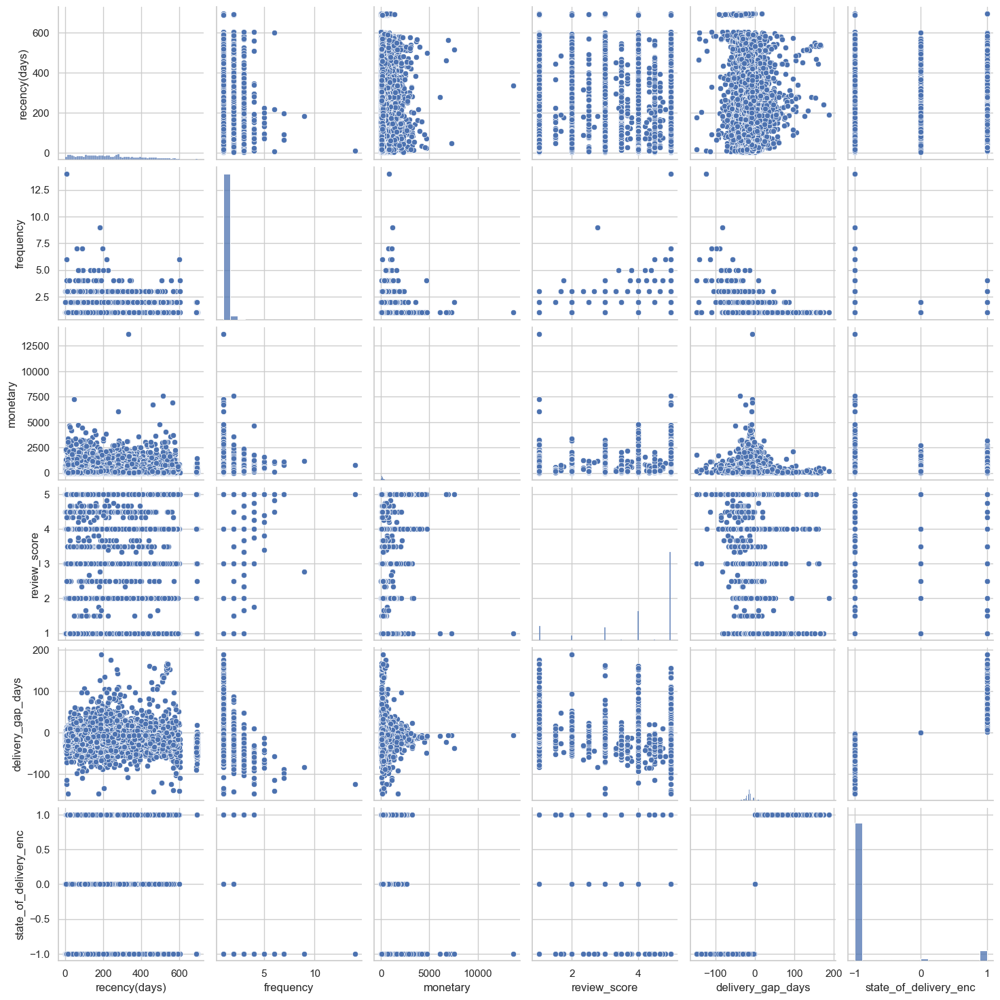

In [42]:
sns.pairplot(df_olist_seg)

In [44]:
df_olist_seg.drop(columns = 'state_of_delivery', inplace=True)

## 2. Clusturing

In [47]:
# Normalisation des données
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score)

In [49]:
# Premier essaie de clustering avec toutes mes features
def standardisation(data_set):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(data_set)
    return pd.DataFrame(X_scaled, index=data_set.index, columns=data_set.columns)


def evaluation(data_set, k ):
    model = KMeans(n_clusters = k, random_state=404)
    X = standardisation(data_set)
    y_pred = model.fit_predict(X)
    # les metriques les plus interressantes
    print(f"sihouette_score : {silhouette_score(X, y_pred)}")
    print(f"calinski_harabasz_score : {calinski_harabasz_score(X, y_pred)}")
    print(f"davies_bouldin_score : {davies_bouldin_score(X, y_pred)}")
    print('-'*150)
    

In [51]:
# Choix des differentes configuration de variables possibles
variables_A = ['recency(days)', 'frequency', 'monetary']
variables_B = ['recency(days)', 'frequency', 'monetary', 'review_score']
variables_C = ['recency(days)', 'frequency', 'monetary', 'delivery_gap_days']
variables_D = (df_olist_seg.columns).tolist()

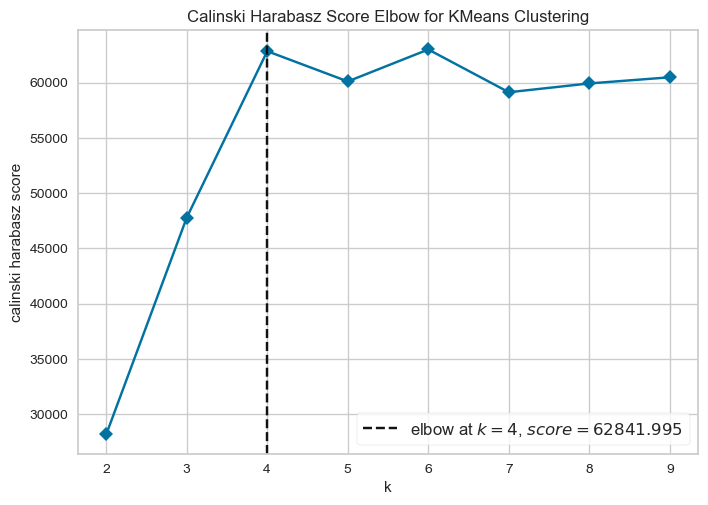

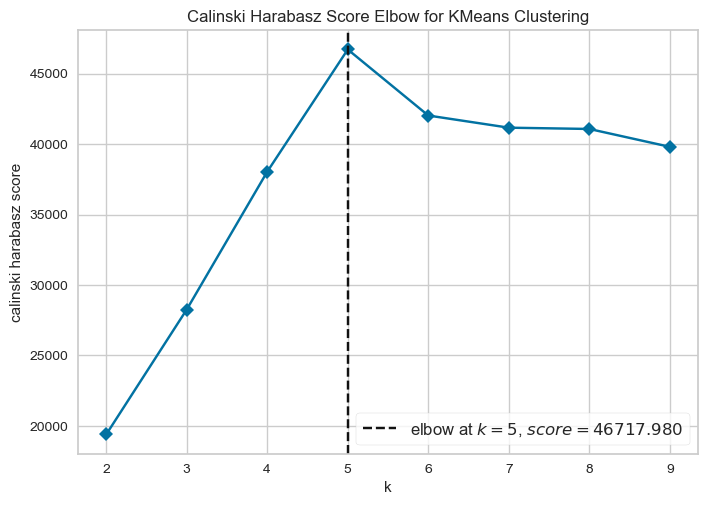

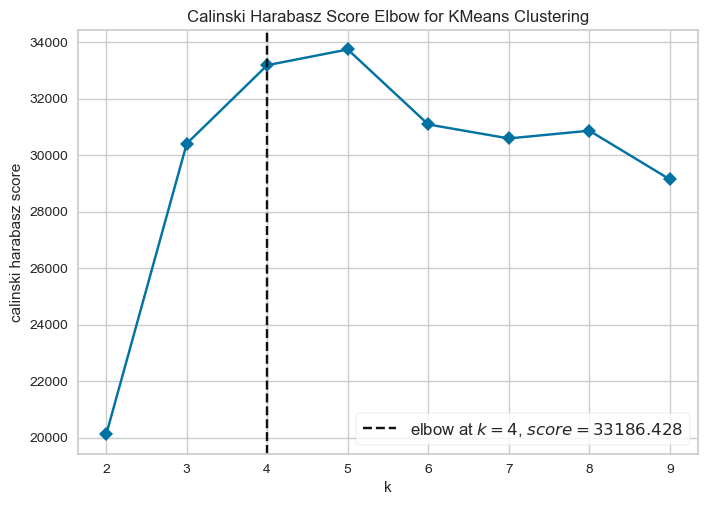

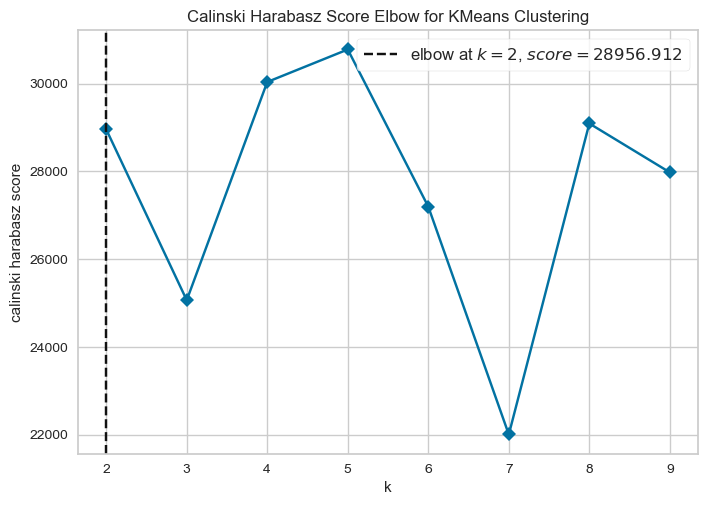

In [53]:
combinations = [variables_A, variables_B, variables_C, variables_D]

# itération sur les differentes combinaison de variables pour avoir le K optimal
for elt in combinations:
    X = standardisation(df_olist_seg[elt])
    model = KMeans(random_state = 404)
    visualizer = KElbowVisualizer(model, k=(2,10), metric = 'calinski_harabasz', timings=False)
    visualizer.fit(X)
    visualizer.poof()

In [55]:
# Définition du dictionnaire de combinaisons avec leurs k optimaux
com_dict = {
    'variables_A': 4,
    'variables_B': 5,
    'variables_C': 4,
    'variables_D': 2
}
vars_map = {
    'variables_A': variables_A,
    'variables_B': variables_B,
    'variables_C': variables_C,
    'variables_D': variables_D
}

# Itération sur le dictionnaire pour évaluer chaque configuration
for elt, k in com_dict.items():
    print(f"Évaluation pour la confugration {elt} avec k = {k}")
    evaluation(df_olist_seg[vars_map[elt]], k)

Évaluation pour la confugration variables_A avec k = 4
sihouette_score : 0.4889499595859786
calinski_harabasz_score : 62841.99538654085
davies_bouldin_score : 0.6819190146364842
------------------------------------------------------------------------------------------------------------------------------------------------------
Évaluation pour la confugration variables_B avec k = 5
sihouette_score : 0.4178042373984318
calinski_harabasz_score : 46717.98042645737
davies_bouldin_score : 0.7784960284856831
------------------------------------------------------------------------------------------------------------------------------------------------------
Évaluation pour la confugration variables_C avec k = 4
sihouette_score : 0.3424462263124632
calinski_harabasz_score : 33186.42786622936
davies_bouldin_score : 0.9272520921359391
------------------------------------------------------------------------------------------------------------------------------------------------------
Évaluation po

**INTERPRETATION DES RESULTATS**
- **Silhouette Score :** plus il est élevé, mieux c’est (max = 1, mauvais = < 0.3).
- **Calinski-Harabasz Score :** plus il est élevé, mieux c’est.
- **Davies-Bouldin Score :** plus il est bas, mieux c’est.
    - **Option D (toutes les variables) :** Silhouette très élevé (0.55) → très bon. Calinski et Davies moins bons que A. Seulement 2 clusters → peut-être trop simpliste ? → Peut être utile pour un regroupement global binaire (bons clients / à surveiller), mais moins riche que 4 segments.
    -  **Option A (RFM, k=4) :** Très bon compromis sur les trois scores. Calinski-Harabasz le plus élevé. Silhouette très correct (> 0.48). Davies-Bouldin faible (0.68). → Très bon clustering. Interprétable en plus (RFM = segmentation client classique)

### Segmentation RFM → Option A (RFM, k=4)
- **Nombre de Cluster optimal :** 4 cluster

In [59]:
df_rfm = df_olist_seg[variables_A].copy()

In [61]:
final_model = KMeans(n_clusters = 4, random_state=404)
X = standardisation(df_rfm)
df_rfm.loc[:, 'cluster'] = final_model.fit_predict(X)
df_rfm['cluster'] = df_rfm['cluster'].astype('category')

C:\Users\laelo\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


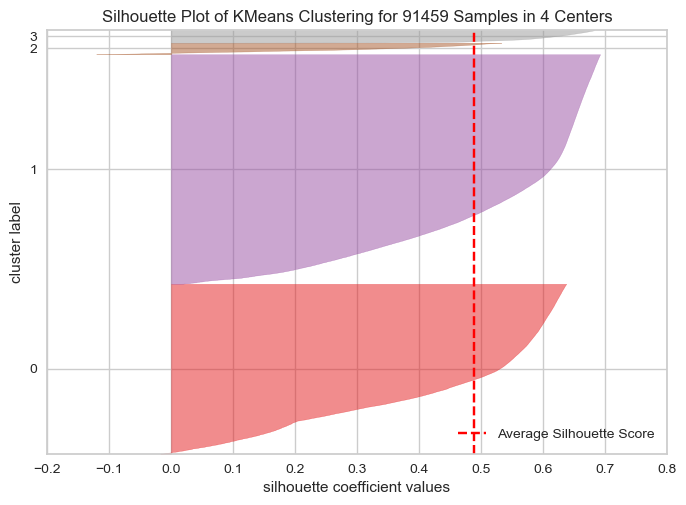

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 91459 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [63]:
# Visualisation des differents cluster
viz = SilhouetteVisualizer(final_model)
viz.fit(X)
viz.show()

- Rouge -> Très gros avec une Moyenne (autour de 0.4–0.5)	Stable mais pas très compact — peut contenir plus de diversité
- Violet -> Très gros aussi avec un Bon score moyen (≈0.5–0.6), Cohérent et bien formé
- Marron -> Très petit (presque une ligne) avec une Très haute silhouette (≈0.7–0.8), Cluster très compact —> peut correspondre à un type très spécifique de clients
- Gris -> Petit avec une Bonne compacité Correct, probablement un segment de niche

### Profilage des clusters

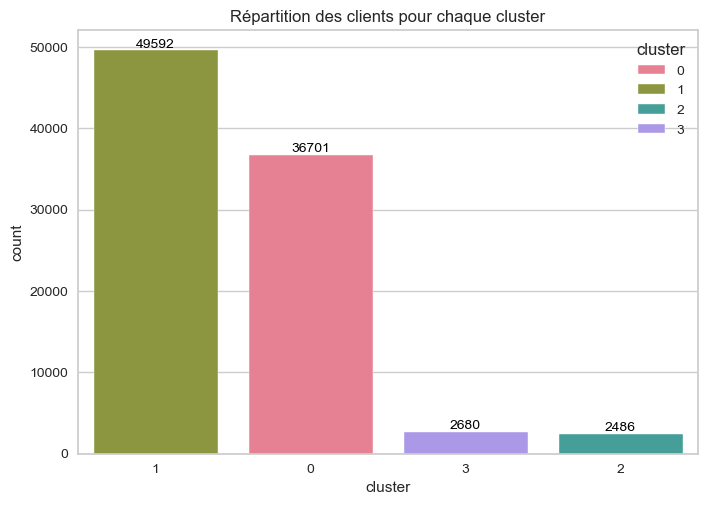

In [67]:
counts = df_rfm['cluster'].value_counts()
sns.countplot(data=df_rfm, x='cluster', order = counts.index, hue='cluster', palette=sns.color_palette('husl', n_colors=4))
plt.title('Répartition des clients pour chaque cluster')
for index, value in enumerate(counts):
    plt.text(index, value, str(value), ha='center', va='bottom', fontsize=10, color='black')
plt.show()

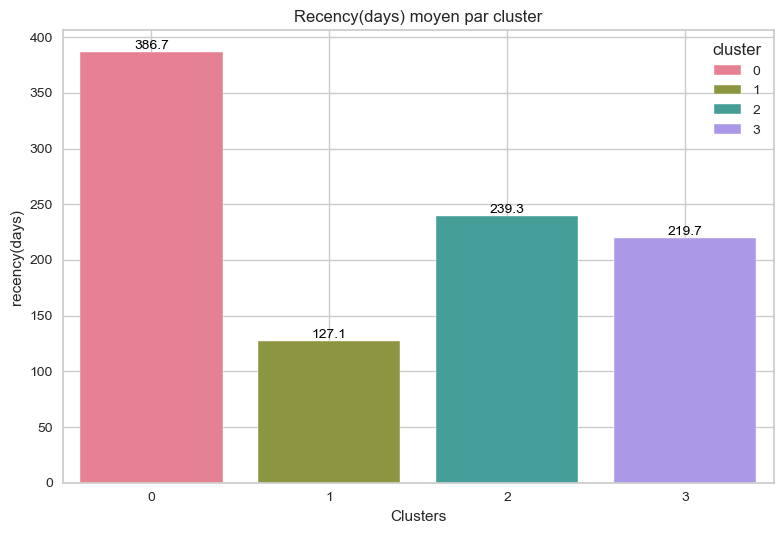

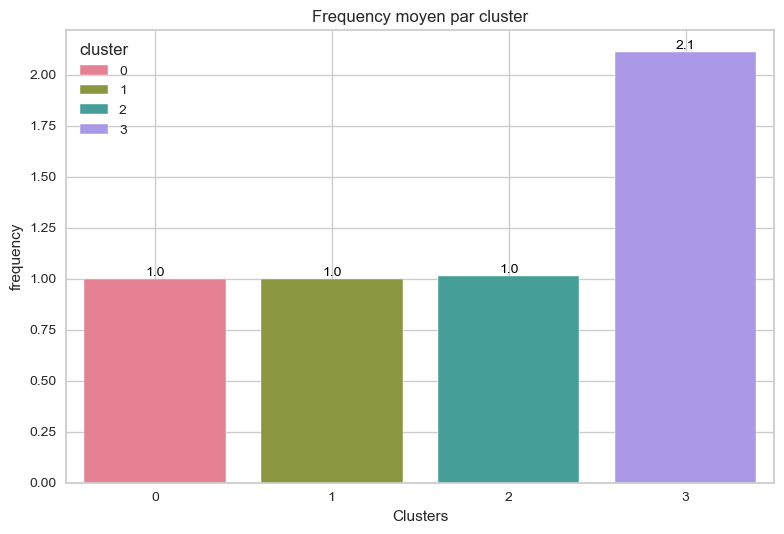

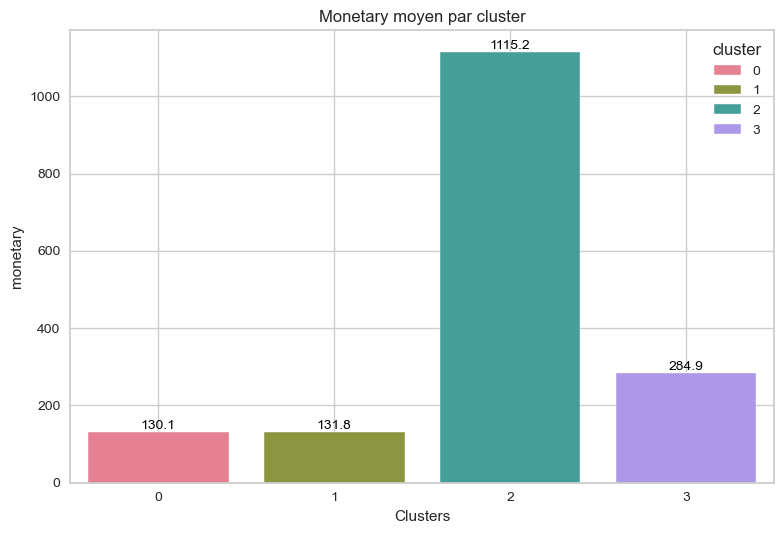

In [69]:
'''les échelles de mes variables (recency, frequency, monetary) sont très différentes.
Si je fais un graphique des moyennes sans ajustement, la variable frequency sera écrasée 
visuellement par les valeurs très élevées de monetary'''
# Solutions possibles :
# 1. je peux Normaliser les moyennes avant de les tracer (RobustScaler moins sensible aux valeurs extrême)
# 2. je peux aussi tracer un graphe par variable
mean_per_cluster = df_rfm.groupby('cluster', observed=True)[['recency(days)', 'frequency', 'monetary']].mean()

for col in mean_per_cluster.columns:
    sns.barplot(x=mean_per_cluster.index, y=mean_per_cluster[col], hue=mean_per_cluster.index, palette=sns.color_palette('husl', n_colors=4))
    plt.title(f'{col.capitalize()} moyen par cluster')
    plt.ylabel(f'{col}')
    plt.xlabel('Clusters')
    plt.grid(True)
    plt.tight_layout()
    for i, val in enumerate(mean_per_cluster[col]):
        plt.text(i, val, f'{val:.1f}', ha='center', va='bottom', fontsize=10, color='black')
    plt.show()

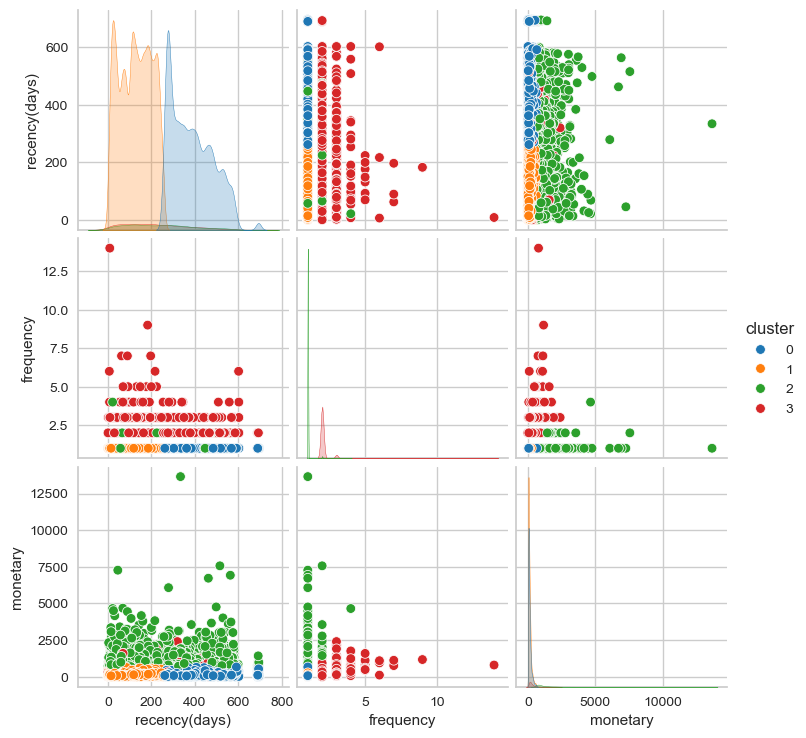

In [71]:
# Des palettes a tester (husl, tab10)
sns.pairplot(data=df_rfm, hue = 'cluster', palette=sns.color_palette('tab10', n_colors=4));

In [73]:
# Etude de chaque cluster en fonction des variables en entrées
for i in range(0, 4):
    print(f"Statistiques pour le cluster {i} ({len(df_rfm[df_rfm['cluster']==i])} clients)")
    print(df_rfm.loc[df_rfm['cluster']==i, :].describe())
    print("*"*100)

Statistiques pour le cluster 0 (36701 clients)
       recency(days)  frequency      monetary
count   36701.000000    36701.0  36701.000000
mean      386.737173        1.0    130.088157
std        96.058446        0.0    104.703310
min       257.000000        1.0      0.010000
25%       298.000000        1.0     59.080000
50%       374.000000        1.0     99.220000
75%       461.000000        1.0    164.790000
max       695.000000        1.0    709.930000
****************************************************************************************************
Statistiques pour le cluster 1 (49592 clients)
       recency(days)  frequency      monetary
count   49592.000000    49592.0  49592.000000
mean      127.132501        1.0    131.778551
std        71.928266        0.0    105.374647
min         1.000000        1.0      0.010000
25%        65.000000        1.0     58.710000
50%       128.000000        1.0    101.600000
75%       188.000000        1.0    168.512500
max       258.000000   

**QUELQUES QUESTIONS AUX QUELLES ON VA ESSAYER DE REPONDRE**
- Description générale -> (Acheteurs occasionnels, réguliers, VIP, etc.)
- Recurence	-> Depuis combien de temps leur dernier achat ?
- Frequence	-> À quelle fréquence achètent-ils ?
- Montant -> Combien dépensent-ils en moyenne ?
- Stratégie marketing recommandée -> Que faire pour ce type de clients ?

**Cluster 0 :** 36701 clients (40,13 % du total)
- Recency (jours) : min = 257, moyenne = 386,73, max = 695
- Frequency (achats) : min = 1, moyenne = 1, max = 1
- Monetary (REAL) : min = 0,01, moyenne = 104,7, max = 709,93
  - **Caracteristiques :** Clients qui ont acheté une seule fois, il y a presque 1 an, avec un panier moyen de 104,7 REAL
    - Type de clients : Clients occasionnels / à l’abandon
    - Fréquence : Très faible (1 achat seulement)
    - Recurence : Achat lointain (plus de 1 an)
    - Montant : Achat moyen correct mais irrégulier
  - **Action :** Relance par e-mail (offres spéciales pour les réactiver), Programme de fidélité pour les inciter à revenir, Promotions ciblées sur produits qu’ils ont déjà achetés.

**Cluster 1 :** 49592 clients (54,22 % du total)
- Recency (jours) : min = 1, moyenne = 127,13, max = 258 
- Frequency (achats) : min = 1, moyenne = 1, max = 1
- Monetary (REAL) : min = 0,01, moyenne = 131,77, max = 661,57
  - **Caracteristiques :** Clients ayant effectué un seul achat, il y a moins de 9 mois. Panier moyen légèrement supérieur (131,77 REAL).
    - Type de clients : En sommeil (potentiel à réactiver)
    - Fréquence : Très faible (1 achat seulement)
    - Recurence : un melange de client nouveau et ancien (entre 1 et 258 jours)
    - Montant : Achat moyen correct mais irrégulier
  - **Action :** Relances personnalisées par e-mail (offres spéciales pour les réactiver), offre de fidélité et offres de bienvenue pour garder les nouveau clients sur des produits similaire qu'il ont achétées (ou des produits complementaires). 

**Cluster 2 :** 2486 clients (2,72 % du total)
- Recency (jours) : min = 1, moyenne = 239,31, max = 694  
- Frequency (achats) : min = 1, moyenne = 1, max = 4
- Monetary (REAL) : min = 610,80, moyenne = 1 115,21, max = 13 664,08
  - **Caracteristiques :** Clients qui ont acheté une à 4 fois, il y a plus de 8 mois, avec un panier moyen de 1115.21 REAL
    - Type de clients :  Grands acheteurs non fidélisés
    - Fréquence : faible 
    - Recurence : un melange de client nouveau et ancien (entre 1j à plus d'1an)
    - Montant : Achat très élévé mais irrégulier
  - **Action :** valorisation spéciale (ex : accès anticipé aux ventes privées, aux promotions, cadeaux exclusifs), offres de bienvenue pour les nouveau et Fidélisation proactive pour augmenter la fréquence d'achat.

**Cluster 3 :** 2680 clients (2,93 % du total)
- Recency (jours) : min = 1, moyenne = 219,71, max = 692    
- Frequency (achats) : min = 2, moyenne = 2, max = 14  
- Monetary (REAL) : min = 1,25, moyenne = 284,93, max = 2 400,48
  - **Caracteristiques :** Clients fidèles, Montants élevés et comportement régulier.
    - Type de clients : Acheteurs réguliers / Loyaux
    - Fréquence : Acheteurs réguliers (min 2 achats)
    - Recurence : un melange de client nouveau et ancien (entre 1j à plus d'1an)
    - Montant : Achat élévé et régulier
  - **Action :** cadeaux, programmes VIP. Toujours des offres de bienvenue pour les nouveaux et des programmes de fidélité pour les anciens. Récompenses pour l'engagement (ex : cadeaux, points bonus).

**SYTHESE GENERALE**
Majorité de la base constituée de clients peu fidèles (Clusters 0 et 1 ➔ besoin urgent de stratégies de réactivation).
Potentiel élevé à exploiter sur les gros acheteurs et clients fidèles (Clusters 2 et 3 ➔ programmes de fidélisation et récompenses adaptées).

**Objectifs marketing :**
Réactiver les clients inactifs par emailings ciblés.
Fidéliser les gros acheteurs et clients réguliers.
Transformer les acheteurs occasionnels en clients réguliers

### Visualisation des clusters

#### TSNE

In [80]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import RobustScaler
import plotly.express as px

In [82]:
#help(TSNE)

In [84]:
def affichage_tSNE(df, std='standardisation'):
    '''La fonction prend en parametre un dataframe et un choix de standardisation
    Et puis elle affiche les donnée en 2D'''
    
    if std!='standardisation':
        scaler = RobustScaler()
        X=scaler.fit_transform(df.select_dtypes(include=['int64', 'float64']))
    else:
        X = standardisation(df.select_dtypes(include=['int64', 'float64']))
        
    cluster = df['cluster']
    tsne = TSNE(n_components=2, perplexity=30, max_iter=1000, init='pca', random_state=404)
    X_tsne = tsne.fit_transform(X)
    # Affichage des deux composantes
    plt.figure(figsize=(10,6))
    sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue=cluster, palette=sns.color_palette('tab10', n_colors=4), alpha=0.7)
    plt.xlabel('Composante 1')
    plt.ylabel('Composante 2')
    plt.title('Visualisation t-SNE des clusters')
    plt.legend(title="Cluster")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

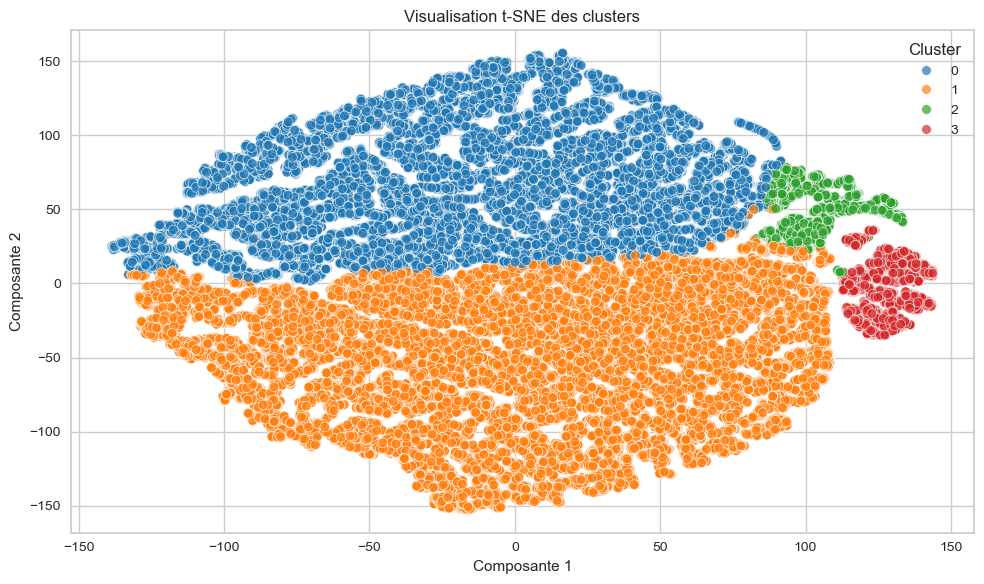

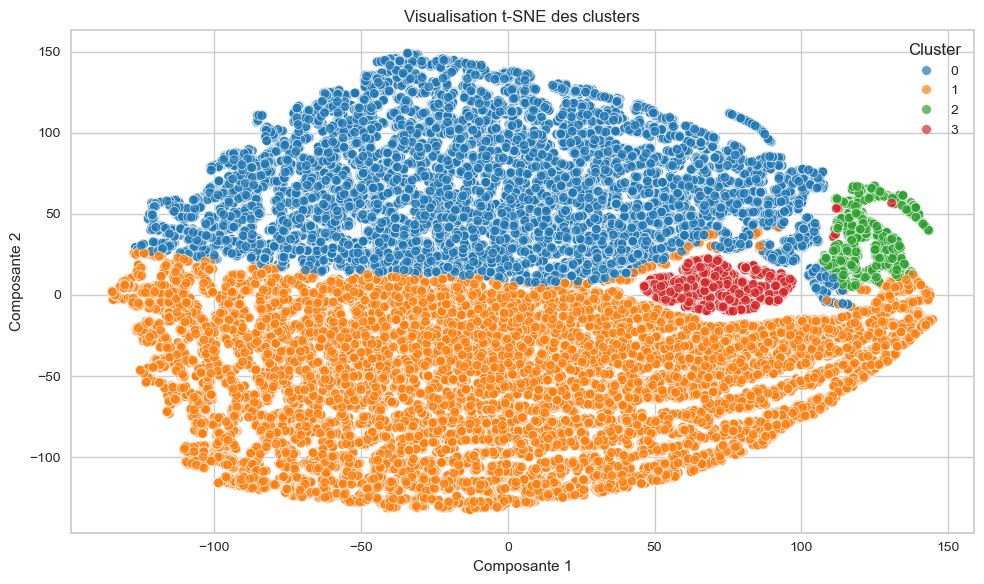

In [86]:
affichage_tSNE(df_rfm, std='standardisation')
print('*'*150)
affichage_tSNE(df_rfm, std='RbScaler')

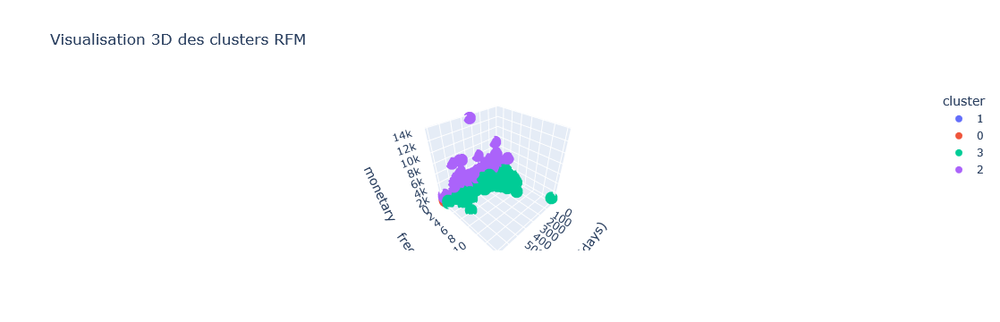

In [88]:
# Essayons une visualisation 3D
fig = px.scatter_3d(
    df_rfm,
    x="recency(days)",
    y="frequency",
    z="monetary",
    color="cluster",
    title="Visualisation 3D des clusters RFM",
)

fig.show()

In [90]:
mean_per_cluster.reset_index(inplace=True)

In [92]:
# Affichage sur un RadarPlot
from math import pi

cols = ['recency(days)', 'frequency', 'monetary']
mean_per_cluster[cols] = standardisation(mean_per_cluster[cols])

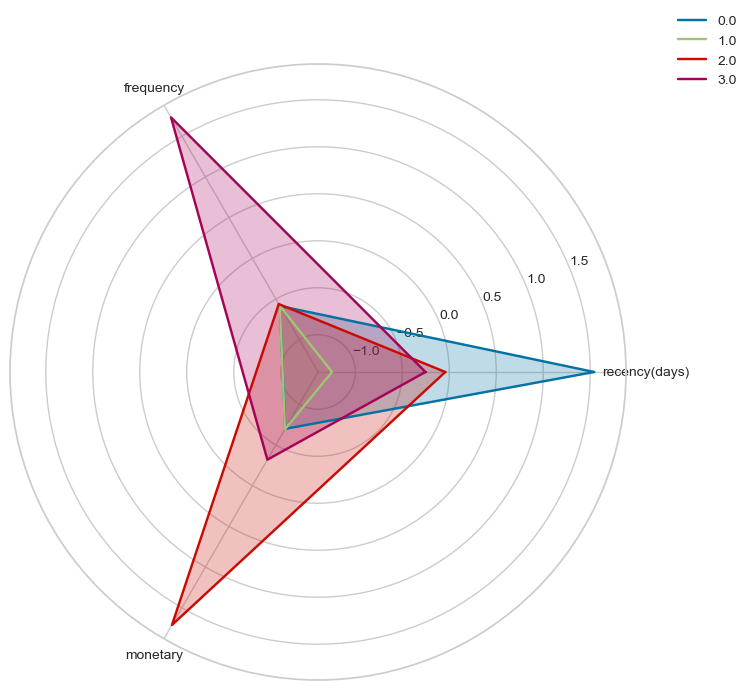

In [94]:
# 4. Préparer les données pour le radar plot
# On va uniquement utiliser les colonnes numériques pour être affichées sur le cercle
N = len(cols)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]  # Pour fermer le polygone

# 5. Tracer le radar plot en mode polaire
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
for index, row in mean_per_cluster.iterrows():
    values = row[cols].tolist()
    values += values[:1]  # Fermer le polygone
    ax.plot(angles, values, label=row['cluster'])  # La légende affichera le nom du cluster
    ax.fill(angles, values, alpha=0.25)

# Les étiquettes sur le cercle correspondent uniquement aux dimensions
plt.xticks(angles[:-1], cols)

plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.show()

## Simulation d'un Contrat de Maintenance :
- Objectif : Vérifier la stabilité du modèle de clustering dans le temps.
- Méthode : Calcul de l'ARI entre le modèle initial et des modèles recalculés à différentes dates.

### 1. Définition des périodes d'analyse
- Charger le DataFrame nettoyé avant feature engineering (**df_olist**).
- Choisir T0 (date la plus ancienne) et T (date la plus récente) : j'ai 695 jours au total, soit presque 2 ans (1 an = 365 jours). Donc 695 ≈ 1 an et 10 mois.
- Créer des points d'analyse intermédiaires (quotidiens ou hebdomadaires par exemple).

### 2. Pipeline par période
Pour chaque date t :
- Sélectionner les données jusqu'à t.
- Refaire le feature engineering sur ces données.
- Appliquer le clustering sur ces données.
- Calculer l'ARI par rapport au modèle initial.
- Stocker le score ARI pour la date t.

### 3. Analyse des résultats
- Stocker les résultats dans un dictionnaire ou un DataFrame.
- Visualiser l'évolution du score ARI au fil du temps (courbe : jours vs ARI).

### 4. Analyse complémentaire
- Observer l'évolution de la distribution de certaines features.
- Utiliser des tests statistiques type Kolmogorov-Smirnov.

### 5. Conclusion
- Interprétation de la stabilité ou instabilité observée.
- Recommandations sur la fréquence de réentraînement du modèle.


In [97]:
from sklearn.metrics import adjusted_rand_score
from scipy.stats import ks_2samp

# Définition des périodes en Calculant la date minimale 
min_date = df_olist['order_purchase_timestamp_dt'].min()
df_olist['days_since_min(days)'] = (df_olist['order_purchase_timestamp_dt'] - min_date).dt.days

In [111]:
#  Boucle de simulation
period_days = list(range(30, 696, 30)) # choix a partir de 30j, car de 0 à 30j sera notre reference
"""
Pour chaque date choisie :
- Filtrer les données jusqu'à cette date.
- Appliquer le même feature engineering qu'initialement.
- Réaliser un clustering (en gardant les mêmes hyperparamètres).
- Comparer au clustering de référence avec un score ARI.
- Sauvegarder le score ARI et la date associée.
- Ajoutons un test de Kolmogorov-Smirnov entres mes features et la stocker dans un dict
"""

# df_rfm est le dataframe de reference avec toutes les date et les cluster dans colonne cluster 
def creation_rfm(df) -> pd.DataFrame:
    reference_date = df['days_since_min(days)'].max() + 1 # +1 jours car ici on manipule des entiers
    
    new_df = df.groupby(['customer_unique_id']).agg({
    'days_since_min(days)': lambda x : reference_date - x.max(), # R
    'customer_id': 'count',                                      # F
    'payment_value': 'sum',                                      # M 
    })
    return new_df


def modeling(df) -> pd.DataFrame:
    # 1. Standardiser les données tout en conservant les index
    X = standardisation(df)
    
    # 2. Clustering
    final_model = KMeans(n_clusters=4, random_state=404)
    df['cluster'] = final_model.fit_predict(X)
    df['cluster'] = df['cluster'].astype('category')
    return df

#disposons d'abord d’un clustering de référence sur une période initiale de 30 jours
df_reference = df_olist.loc[df_olist['days_since_min(days)'] <= 30, :]
df_reference = creation_rfm(df_reference)
df_reference = modeling(df_reference)



score_ARI = {}
p_value_ks_2samp={}
for dyt in period_days:
    df = df_olist.loc[df_olist['days_since_min(days)'] <= dyt, :]
    # 2. Créer nouveau RFM
    new_rfm = creation_rfm(df)
    
    # 3. Créer clustering sur new_df
    new_df = modeling(new_rfm)
    
    # 4. Filtrer uniquement les clients communs
    common_clients = df_reference.index.intersection(new_rfm.index)
    ref_cluster = df_reference.loc[common_clients, 'cluster']
    new_cluster = new_df.loc[common_clients, 'cluster']
     # 5. Calcul du score ARI
    score = adjusted_rand_score(ref_cluster, new_cluster)
    score_ARI[str(dyt)] = score
    
    # Ajoutons un test de Kolmogorov-Smirnov entres mes features
    # Pour chaque paire de colonnes (assumant le même ordre)
    df1 = df_reference.loc[common_clients].drop(columns='cluster')
    df2 = new_df.loc[common_clients].drop(columns='cluster')
    p_values=[]
    for col1, col2 in zip(df1.columns, df2.columns):
        # Exécute le test KS entre la colonne 'col1' de df1 et 'col2' de df2
        stat, p_value = ks_2samp(df1[col1], df2[col2])
        p_values.append(p_value)
    p_value_ks_2samp[str(dyt)] = p_values
        

C:\Users\laelo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

C:\Users\laelo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\laelo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

C:\Users\laelo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

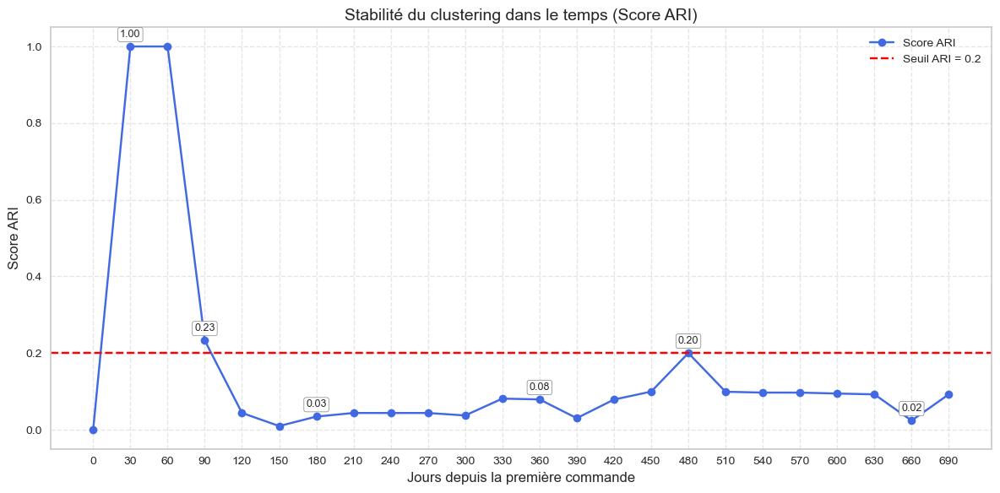

In [117]:
# Visualisation
"""
Tracer la courbe de l'évolution du score ARI en fonction du temps.
Axe X = Dates (ou Jours), Axe Y = Score ARI.
Ajouter si besoin un seuil d'alerte.
"""
# Conversion et tri
x_vals = [int(k) for k in score_ARI.keys()]
y_vals = list(score_ARI.values())

# Définisons les ticks sur l'axe des X
ticks_x = list(range(0, max(x_vals)+1, 30))  # tous les 30 jours

# Points clés à annoter
key_days = [30, 90, 180, 360, 480, 660]

# Création du graphique
plt.figure(figsize=(12, 6))
plt.plot(x_vals, y_vals, '-o', color='royalblue', label='Score ARI')

# Ligne de seuil ARI
seuil = 0.2
plt.axhline(y=seuil, color='red', linestyle='--', label='Seuil ARI = 0.2')

# Annotations sur les points sélectionnés
for x, y in zip(x_vals, y_vals):
    if x in key_days:
        plt.annotate(f'{y:.2f}',
                     (x, y),
                     textcoords="offset points",
                     xytext=(0, 8),
                     ha='center',
                     fontsize=9,
                     bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="gray", lw=0.5))

# Paramètres du graphique
plt.xticks(ticks_x)  # Appliquer les ticks personnalisés
plt.title("Stabilité du clustering dans le temps (Score ARI)", fontsize=14)
plt.xlabel("Evolution des periodes (jours)", fontsize=12)
plt.ylabel("Score ARI", fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [133]:
# Assumons que les variables sont toujours dans le même ordre
variables = ['recency', 'frequency', 'monetary']

# Création du DataFrame comparatif
df_pvalues = pd.DataFrame.from_dict(p_value_ks_2samp, orient='index', columns=variables)

# Conversion de l’index (str) en entier pour tri si besoin
df_pvalues.index = df_pvalues.index.astype(int)

# Trie les index si ce n’est pas déjà le cas
df_pvalues = df_pvalues.sort_index()

# Affiche le tableau
print(df_pvalues)

     recency  frequency  monetary
0      0.000      1.000     1.000
30     1.000      1.000     1.000
60     1.000      1.000     1.000
90     0.000      1.000     1.000
120    0.000      1.000     1.000
150    0.000      1.000     1.000
180    0.000      1.000     1.000
210    0.000      1.000     1.000
240    0.000      1.000     1.000
270    0.000      1.000     1.000
300    0.000      1.000     1.000
330    0.000      1.000     1.000
360    0.000      1.000     1.000
390    0.000      1.000     1.000
420    0.000      1.000     1.000
450    0.000      1.000     1.000
480    0.000      1.000     1.000
510    0.000      1.000     1.000
540    0.000      1.000     1.000
570    0.000      1.000     1.000
600    0.000      1.000     1.000
630    0.000      0.998     1.000
660    0.000      0.998     1.000
690    0.000      0.998     1.000


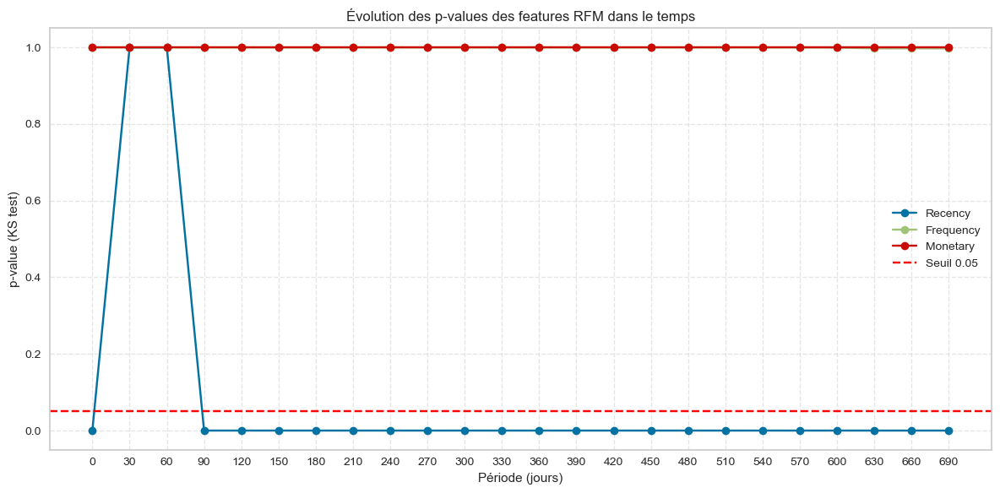

In [145]:
# Traçons des courbes de p-values
plt.figure(figsize=(12, 6))
plt.plot(df_pvalues.index, df_pvalues["recency"], label="Recency", marker='o')
plt.plot(df_pvalues.index, df_pvalues["frequency"], label="Frequency", marker='o')
plt.plot(df_pvalues.index, df_pvalues["monetary"], label="Monetary", marker='o')
plt.axhline(y=0.05, color='red', linestyle='--', label="Seuil 0.05")
plt.xlabel("Période (jours)")
plt.ylabel("p-value (KS test)")
plt.xticks(ticks_x)
plt.title("Évolution des p-values des features RFM dans le temps")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### Analyse de la stabilité du clustering dans le temps

Afin d’évaluer la robustesse de notre segmentation client RFM dans le temps, nous avons mesuré le score ARI (Adjusted Rand Index) à différentes périodes, ainsi que les changements de distribution des variables RFM.

---

#### À quel moment le score ARI commence-t-il à chuter ?

L’analyse du graphique ARI montre une **forte chute du score à partir de 90 jours** :

- Jusqu’à **60 jours**, le score ARI reste à **1.0**, indiquant une stabilité parfaite des clusters (les segments restent inchangés).
- À **90 jours**, le score descend brutalement à **0.23**, puis continue à baisser en-dessous de **0.1** dans les mois suivants.

**Conclusion** : La segmentation commence à se dégrader **dès le troisième mois**, avec une forte instabilité des regroupements au-delà de cette période.

---

#### Le clustering reste-t-il fiable dans le temps ?

Non, le clustering ne reste pas fiable dans le temps :

- Dès le **troisième mois**, la stabilité des clusters est fortement altérée (score ARI < 0.2).
- L’analyse statistique montre que la variable **`recency` change significativement** de distribution dès **60 jours**, ce qui perturbe les regroupements.
- Bien que les variables `frequency` et `monetary` conservent une distribution stable, cela ne suffit pas à garantir la cohérence des clusters.

**Conclusion** : Le modèle de segmentation devient obsolète après environ **2 à 3 mois**.

---

#### Faut-il prévoir un réentraînement à une certaine fréquence ?

Oui, il est nécessaire de prévoir un **réentraînement régulier** pour maintenir la qualité de la segmentation :

- Le **seuil critique se situe entre 60 et 90 jours**, après quoi les segments ne sont plus représentatifs.
- Un **réentraînement tous les 60 jours** (2 mois) permettrait de capturer l’évolution des comportements clients, notamment en ce qui concerne la récence des achats.

**Recommandation** : **Mettre à jour le modèle de clustering tous les 2 mois** pour conserver des segments pertinents et exploitables.
